In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/pretrained-radiopaedia-ct-model/pytorch/default/1/pretrained_model.pth
/kaggle/input/radiopaedia-lung-ct-segmentation-dataset/rp_lung_msk/rp_lung_msk/6.nii
/kaggle/input/radiopaedia-lung-ct-segmentation-dataset/rp_lung_msk/rp_lung_msk/9.nii
/kaggle/input/radiopaedia-lung-ct-segmentation-dataset/rp_lung_msk/rp_lung_msk/8.nii
/kaggle/input/radiopaedia-lung-ct-segmentation-dataset/rp_lung_msk/rp_lung_msk/7.nii
/kaggle/input/radiopaedia-lung-ct-segmentation-dataset/rp_lung_msk/rp_lung_msk/4.nii
/kaggle/input/radiopaedia-lung-ct-segmentation-dataset/rp_lung_msk/rp_lung_msk/5.nii
/kaggle/input/radiopaedia-lung-ct-segmentation-dataset/rp_lung_msk/rp_lung_msk/3.nii
/kaggle/input/radiopaedia-lung-ct-segmentation-dataset/rp_lung_msk/rp_lung_msk/2.nii
/kaggle/input/radiopaedia-lung-ct-segmentation-dataset/rp_lung_msk/rp_lung_msk/1.nii
/kaggle/input/radiopaedia-lung-ct-segmentation-dataset/rp_msk/rp_msk/6.nii
/kaggle/input/radiopaedia-lung-ct-segmentation-dataset/rp_msk/rp_msk/9.nii


In [ ]:
import os
import nibabel as nib
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm

# =============================================
# Configuration
# =============================================
BASE_PATH = '/kaggle/input/radiopaedia-lung-ct-segmentation-dataset'
SUBJECT_IDS = [str(i) for i in range(1, 10)]  # Subjects 1-9

# =============================================
# Verification Functions
# =============================================
def verify_subject(subject_id):
    """Verify all three files for a single subject"""
    results = {
        'subject_id': subject_id,
        'image_exists': False,
        'mask_exists': False,
        'lung_mask_exists': False,
        'shapes_match': None,
        'voxel_matches': None,
        'positive_slices': 0,
        'total_slices': 0,
        'lung_volume_voxels': 0
    }
    
    try:
        # Load all three files
        im_path = os.path.join(BASE_PATH, 'rp_im', 'rp_im', f'{subject_id}.nii')
        msk_path = os.path.join(BASE_PATH, 'rp_msk', 'rp_msk', f'{subject_id}.nii')
        lung_path = os.path.join(BASE_PATH, 'rp_lung_msk', 'rp_lung_msk', f'{subject_id}.nii')
        
        im = nib.load(im_path)
        msk = nib.load(msk_path)
        lung = nib.load(lung_path)
        
        # Get data arrays
        im_data = im.get_fdata()
        msk_data = msk.get_fdata()
        lung_data = lung.get_fdata()
        
        # Update verification results
        results.update({
            'image_exists': True,
            'mask_exists': True,
            'lung_mask_exists': True,
            'image_shape': im_data.shape,
            'mask_shape': msk_data.shape,
            'lung_mask_shape': lung_data.shape,
            'shapes_match': im_data.shape == msk_data.shape == lung_data.shape,
            'voxel_matches': np.allclose(im.header.get_zooms(), msk.header.get_zooms()) and 
                            np.allclose(im.header.get_zooms(), lung.header.get_zooms()),
            'positive_slices': np.count_nonzero(msk_data.sum(axis=(0,1))),
            'total_slices': im_data.shape[2],
            'lung_volume_voxels': np.sum(lung_data),
            'image_range': (np.min(im_data), np.max(im_data)),
            'mask_values': np.unique(msk_data),
            'lung_mask_values': np.unique(lung_data)
        })
        
    except Exception as e:
        results['error'] = str(e)
    
    return results

def visualize_subject(subject_id):
    """Visualize all three volumes for a subject"""
    im_path = os.path.join(BASE_PATH, 'rp_im', 'rp_im', f'{subject_id}.nii')
    msk_path = os.path.join(BASE_PATH, 'rp_msk', 'rp_msk', f'{subject_id}.nii')
    lung_path = os.path.join(BASE_PATH, 'rp_lung_msk', 'rp_lung_msk', f'{subject_id}.nii')
    
    im = nib.load(im_path).get_fdata()
    msk = nib.load(msk_path).get_fdata()
    lung = nib.load(lung_path).get_fdata()
    
    # Create mosaic visualization
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    slices = [im.shape[2]//4, im.shape[2]//2, 3*im.shape[2]//4]
    
    for i, sl in enumerate(slices):
        # CT image
        axes[0,i].imshow(im[:,:,sl], cmap='gray')
        axes[0,i].set_title(f'CT Slice {sl}')
        
        # CT with COVID mask overlay
        axes[1,i].imshow(im[:,:,sl], cmap='gray')
        axes[1,i].imshow(np.ma.masked_where(msk[:,:,sl]==0, msk[:,:,sl]), 
                        cmap='Reds', alpha=0.5)
        axes[1,i].set_title(f'COVID Lesions')
        
        # CT with lung mask overlay
        axes[2,i].imshow(im[:,:,sl], cmap='gray')
        axes[2,i].imshow(np.ma.masked_where(lung[:,:,sl]==0, lung[:,:,sl]), 
                        cmap='Blues', alpha=0.3)
        axes[2,i].set_title(f'Lung Mask')
    
    plt.suptitle(f'Subject {subject_id} Verification', y=0.92)
    plt.tight_layout()
    plt.show()

# =============================================
# Main Verification Process
# =============================================
if __name__ == '__main__':
    # Verify all subjects
    verification_results = []
    for sub_id in tqdm(SUBJECT_IDS, desc="Verifying subjects"):
        res = verify_subject(sub_id)
        verification_results.append(res)
    
    # Convert to DataFrame
    df = pd.DataFrame(verification_results)
    
    # Print summary
    print("\n=== VERIFICATION SUMMARY ===")
    print(f"Subjects checked: {len(df)}")
    print(f"Subjects with all files: {sum(df['image_exists'] & df['mask_exists'] & df['lung_mask_exists'])}")
    print(f"Subjects with shape mismatches: {sum(~df['shapes_match'])}")
    print(f"Total COVID+ slices: {df['positive_slices'].sum()}")
    print(f"Average lung volume: {df['lung_volume_voxels'].mean():.0f} voxels")
    
    # Save full report
    df.to_csv('dataset_verification_report.csv', index=False)
    print("\nSaved full report to 'dataset_verification_report.csv'")
    
    # Visualize sample subject
    print("\nVisualizing sample subject...")
    visualize_subject("3")  # Visualize subject with most slices

In [4]:
import nibabel as nib
import os

base_path = '/kaggle/input/radiopaedia-lung-ct-segmentation-dataset'
paths = {
    'CT': os.path.join(base_path, 'rp_im', 'rp_im'),
    'COVID_mask': os.path.join(base_path, 'rp_msk', 'rp_msk'),
    'Lung_mask': os.path.join(base_path, 'rp_lung_msk', 'rp_lung_msk')
}

# Verify all files exist
subject_ids = sorted([f.split('.')[0] for f in os.listdir(paths['CT']) if f.endswith('.nii')])

print("Subject | CT Slices | COVID Mask | Lung Mask")
print("--------|-----------|------------|----------")
for sub_id in subject_ids:
    ct = nib.load(os.path.join(paths['CT'], f"{sub_id}.nii"))
    covid = nib.load(os.path.join(paths['COVID_mask'], f"{sub_id}.nii"))
    lung = nib.load(os.path.join(paths['Lung_mask'], f"{sub_id}.nii"))
    
    print(f"{sub_id:>7} | {ct.shape[-1]:>9} | {covid.shape[-1]:>10} | {lung.shape[-1]:>8}")

print(f"\nTotal subjects: {len(subject_ids)}")
print(f"Total CT slices: {sum(ct.shape[-1] for ct in [nib.load(os.path.join(paths['CT'], f'{s}.nii')) for s in subject_ids])}")

Subject | CT Slices | COVID Mask | Lung Mask
--------|-----------|------------|----------
      1 |        45 |         45 |       45
      2 |        39 |         39 |       39
      3 |       418 |        418 |      418
      4 |        39 |         39 |       39
      5 |        66 |         66 |       66
      6 |        42 |         42 |       42
      7 |        42 |         42 |       42
      8 |        45 |         45 |       45
      9 |        93 |         93 |       93

Total subjects: 9
Total CT slices: 829


In [2]:
import os
import numpy as np
import nibabel as nib
import cv2

# ==== CONFIG ====
IMG_SIZE = (256, 256)  # Target resize size
BASE_DIR = "/kaggle/input/radiopaedia-lung-ct-segmentation-dataset"

IMG_DIR = os.path.join(BASE_DIR, "rp_im", "rp_im")
LUNG_MASK_DIR = os.path.join(BASE_DIR, "rp_lung_msk", "rp_lung_msk")
LESION_MASK_DIR = os.path.join(BASE_DIR, "rp_msk", "rp_msk")

OUT_DIR = "/kaggle/working/preprocessed"
os.makedirs(OUT_DIR, exist_ok=True)

def preprocess_slice(slice_img, is_mask=False):
    """Resize & normalize a single slice."""
    slice_img = cv2.resize(slice_img, IMG_SIZE, interpolation=cv2.INTER_NEAREST if is_mask else cv2.INTER_AREA)
    if is_mask:
        slice_img = (slice_img > 0).astype(np.uint8)
    else:
        slice_img = slice_img.astype(np.float32)
        slice_img = (slice_img - np.min(slice_img)) / (np.max(slice_img) - np.min(slice_img) + 1e-8)
    return slice_img

images, lung_masks, lesion_masks = [], [], []

nii_files = sorted(os.listdir(IMG_DIR))

for nii_file in nii_files:
    img_path = os.path.join(IMG_DIR, nii_file)
    lung_path = os.path.join(LUNG_MASK_DIR, nii_file)
    lesion_path = os.path.join(LESION_MASK_DIR, nii_file)
    
    # Load volumes
    img_vol = nib.load(img_path).get_fdata()
    lung_vol = nib.load(lung_path).get_fdata()
    lesion_vol = nib.load(lesion_path).get_fdata()
    
    # Loop over slices
    for i in range(img_vol.shape[2]):  # Assuming slices in the 3rd axis
        img_slice = preprocess_slice(img_vol[:, :, i], is_mask=False)
        lung_slice = preprocess_slice(lung_vol[:, :, i], is_mask=True)
        lesion_slice = preprocess_slice(lesion_vol[:, :, i], is_mask=True)
        
        images.append(img_slice)
        lung_masks.append(lung_slice)
        lesion_masks.append(lesion_slice)

# Convert to NumPy arrays
images = np.array(images)
lung_masks = np.array(lung_masks)
lesion_masks = np.array(lesion_masks)

# Save arrays
np.save(os.path.join(OUT_DIR, "images.npy"), images)
np.save(os.path.join(OUT_DIR, "lung_masks.npy"), lung_masks)
np.save(os.path.join(OUT_DIR, "lesion_masks.npy"), lesion_masks)

print(f"✅ Preprocessing complete. Saved to {OUT_DIR}")
print(f"Shapes: Images {images.shape}, Lung masks {lung_masks.shape}, Lesion masks {lesion_masks.shape}")


✅ Preprocessing complete. Saved to /kaggle/working/preprocessed
Shapes: Images (829, 256, 256), Lung masks (829, 256, 256), Lesion masks (829, 256, 256)


In [5]:
import os
import numpy as np
import cv2

# Load your preprocessed arrays
images = np.load("/kaggle/working/preprocessed/images.npy")  # shape: (N, 256, 256)

# Create image directory
image_dir = "/kaggle/working/images"
os.makedirs(image_dir, exist_ok=True)

# Save each image as PNG
for i, img in enumerate(images):
    img_uint8 = (img * 255).astype(np.uint8) if img.max() <= 1 else img.astype(np.uint8)
    cv2.imwrite(f"{image_dir}/{i}.png", img_uint8)


In [6]:
import torch
from torch.utils.data import Dataset, DataLoader
import numpy as np
import os

class CTPretrainDataset(Dataset):
    def __init__(self, base_path):
        # Load only the images for pretraining
        self.images = np.load(os.path.join(base_path, "images.npy"))  # shape: (N, 256, 256)

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = self.images[idx]  # shape: (256, 256)
        
        # Add channel dimension
        img = np.expand_dims(img, axis=0)  # (1, 256, 256)
        
        # Convert to tensor
        img = torch.tensor(img, dtype=torch.float32)
        
        return img, img  # return two copies for contrastive learning


# Example model to handle (B, 1, 256, 256)
class SimpleModel(torch.nn.Module):
    def __init__(self, num_classes=2):
        super(SimpleModel, self).__init__()
        self.flatten = torch.nn.Flatten()
        self.fc = torch.nn.Linear(1 * 256 * 256, num_classes)  # Match flattened size

    def forward(self, x):
        x = self.flatten(x)  # (B, 65536)
        x = self.fc(x)
        return x


# Usage
base_path = "/kaggle/working/preprocessed"
dataset = CTPretrainDataset(base_path)
loader = DataLoader(dataset, batch_size=4, shuffle=True)

model = SimpleModel(num_classes=2)

for x1, x2 in loader:
    out = model(x1)
    print(x1.shape, out.shape)  # (4, 1, 256, 256) -> (4, 2)
    break


torch.Size([4, 1, 256, 256]) torch.Size([4, 2])


In [7]:
import torch.nn.functional as F

def nt_xent_loss(z1, z2, temperature=0.5):
    z1 = F.normalize(z1, dim=1)
    z2 = F.normalize(z2, dim=1)
    representations = torch.cat([z1, z2], dim=0)
    similarity_matrix = torch.matmul(representations, representations.T)
    labels = torch.cat([torch.arange(z1.size(0)) for _ in range(2)], dim=0)
    labels = (labels.unsqueeze(0) == labels.unsqueeze(1)).float()
    mask = torch.eye(labels.shape[0], dtype=torch.bool).to(z1.device)
    labels = labels[~mask].view(labels.shape[0], -1)
    similarity_matrix = similarity_matrix[~mask].view(similarity_matrix.shape[0], -1)
    positives = similarity_matrix[labels.bool()]
    negatives = similarity_matrix[~labels.bool()].view(similarity_matrix.shape[0], -1)
    logits = torch.cat([positives.unsqueeze(1), negatives], dim=1)
    labels = torch.zeros(logits.shape[0], dtype=torch.long).to(z1.device)
    logits = logits / temperature
    return F.cross_entropy(logits, labels)


In [8]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import os
import numpy as np

# Free GPU memory before starting
torch.cuda.empty_cache()

# Dataset class
class CTPretrainDataset(Dataset):
    def __init__(self, base_path):
        self.images = np.load(os.path.join(base_path, 'images.npy'))
        self.lung_masks = np.load(os.path.join(base_path, 'lung_masks.npy'))
        self.lesion_masks = np.load(os.path.join(base_path, 'lesion_masks.npy'))

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = torch.tensor(self.images[idx], dtype=torch.float32).unsqueeze(0)
        img = torch.clamp(img, min=-65504.0, max=65504.0)  # avoid float16 overflow
        mask = torch.tensor(self.lung_masks[idx], dtype=torch.float32).unsqueeze(0)
        lesion = torch.tensor(self.lesion_masks[idx], dtype=torch.float32).unsqueeze(0)
        return img, mask, lesion

# Example model with downsampling to avoid huge FC
class SimpleModel(nn.Module):
    def __init__(self):
        super(SimpleModel, self).__init__()
        self.conv1 = nn.Conv2d(1, 8, 3, padding=1)
        self.pool1 = nn.MaxPool2d(2)   # 256 -> 128
        self.conv2 = nn.Conv2d(8, 16, 3, padding=1)
        self.pool2 = nn.MaxPool2d(2)   # 128 -> 64
        self.relu = nn.ReLU()
        self.fc = nn.Linear(16 * 64 * 64, 2)  # 16×64×64 = 65536

    def forward(self, x):
        x = self.relu(self.conv1(x))
        x = self.pool1(x)
        x = self.relu(self.conv2(x))
        x = self.pool2(x)
        x = x.view(x.size(0), -1)
        return self.fc(x)

# Paths
BASE_PATH = "/kaggle/working/preprocessed"
BATCH_SIZE = 4
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Data loader
dataset = CTPretrainDataset(BASE_PATH)
loader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

# Model, optimizer, loss
model = SimpleModel().to(DEVICE)
optimizer = optim.Adam(model.parameters(), lr=1e-4)
criterion = nn.CrossEntropyLoss()

# Mixed precision scaler
scaler = torch.cuda.amp.GradScaler()

# Training loop
for epoch in range(5):
    model.train()
    total_loss = 0
    for imgs, masks, lesions in loader:
        imgs = imgs.to(DEVICE)

        optimizer.zero_grad()

        with torch.cuda.amp.autocast(dtype=torch.float16):
            outputs = model(imgs)
            loss = criterion(outputs, torch.randint(0, 2, (imgs.size(0),), device=DEVICE))

        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        total_loss += loss.item()

    print(f"Epoch {epoch+1} - Loss: {total_loss/len(loader):.4f}")


/tmp/ipykernel_36/3476778545.py:62: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler()
/tmp/ipykernel_36/3476778545.py:73: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(dtype=torch.float16):


Epoch 1 - Loss: 0.7500
Epoch 2 - Loss: 0.7059
Epoch 3 - Loss: 0.6972
Epoch 4 - Loss: 0.6973
Epoch 5 - Loss: 0.6929


In [9]:
# After training loop finishes
save_path = "/kaggle/working/pretrained_model.pth"
torch.save(model.state_dict(), save_path)
print(f"Model saved at {save_path}")


Model saved at /kaggle/working/pretrained_model.pth


In [16]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
from torchvision import models
import numpy as np
import albumentations as A
from albumentations.pytorch import ToTensorV2

# ==== CONFIG ====
BASE_PATH = "/kaggle/working/preprocessed"
BATCH_SIZE = 4
EPOCHS = 20
LR = 1e-4
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ==== Dataset ====
class CTMaskDataset(Dataset):
    def __init__(self, images, masks, transform=None):
        self.images = images
        self.masks = masks
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = self.images[idx]
        mask = self.masks[idx]

        # Ensure 1-channel shape (H, W) -> (H, W, 1)
        if img.ndim == 2:
            img = np.expand_dims(img, axis=-1)

        if self.transform:
            augmented = self.transform(image=img, mask=mask)
            img = augmented['image']
            mask = augmented['mask']

        return img, mask.long()

# ==== Load Data ====
images = np.load(os.path.join(BASE_PATH, "images.npy"))  # (N, 256, 256)
lesion_masks = np.load(os.path.join(BASE_PATH, "lesion_masks.npy"))  # (N, 256, 256)

# Albumentations transforms
train_transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.2),
    A.RandomRotate90(p=0.2),
    A.Normalize(mean=(0.0,), std=(1.0,)),
    ToTensorV2()
])

val_test_transform = A.Compose([
    A.Normalize(mean=(0.0,), std=(1.0,)),
    ToTensorV2()
])

# Dataset splitting 70/15/15
dataset_size = len(images)
train_size = int(0.7 * dataset_size)
val_size = int(0.15 * dataset_size)
test_size = dataset_size - train_size - val_size

full_dataset = CTMaskDataset(images, lesion_masks, transform=None)
train_dataset, val_dataset, test_dataset = random_split(full_dataset, [train_size, val_size, test_size])

# Assign transforms separately
train_dataset = CTMaskDataset(images[train_dataset.indices], lesion_masks[train_dataset.indices], transform=train_transform)
val_dataset = CTMaskDataset(images[val_dataset.indices], lesion_masks[val_dataset.indices], transform=val_test_transform)
test_dataset = CTMaskDataset(images[test_dataset.indices], lesion_masks[test_dataset.indices], transform=val_test_transform)

# Data loaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False)


# ==== Model ====
model = models.segmentation.deeplabv3_resnet50(weights=None, num_classes=2)

# Modify first conv to accept 1 channel instead of 3
model.backbone.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)

# Load pretrained weights but skip conv1 if mismatched
pretrained_dict = torch.load("/kaggle/working/pretrained_model.pth", map_location=DEVICE)
model_dict = model.backbone.state_dict()

# Filter out unmatched keys
pretrained_dict = {k: v for k, v in pretrained_dict.items() if k in model_dict and v.shape == model_dict[k].shape}

# Update model weights
model_dict.update(pretrained_dict)
model.backbone.load_state_dict(model_dict, strict=False)

model = model.to(DEVICE)

# ==== Loss & Optimizer ====
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=LR)

# ==== Training Loop ====
for epoch in range(EPOCHS):
    model.train()
    total_loss = 0
    for imgs, masks in train_loader:
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)

        optimizer.zero_grad()
        outputs = model(imgs)['out']
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    # Validation
    model.eval()
    val_loss = 0
    with torch.no_grad():
        for imgs, masks in val_loader:
            imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
            outputs = model(imgs)['out']
            loss = criterion(outputs, masks)
            val_loss += loss.item()

    print(f"Epoch [{epoch+1}/{EPOCHS}] Train Loss: {total_loss/len(train_loader):.4f} | Val Loss: {val_loss/len(val_loader):.4f}")

# ==== Save Trained Model ====
torch.save(model.state_dict(), "/kaggle/working/deeplabv3_resnet50_trained.pth")
print("✅ Model saved at /kaggle/working/deeplabv3_resnet50_trained.pth")


Epoch [1/20] Train Loss: 0.2011 | Val Loss: 0.0763
Epoch [2/20] Train Loss: 0.0577 | Val Loss: 0.0473
Epoch [3/20] Train Loss: 0.0353 | Val Loss: 0.0258
Epoch [4/20] Train Loss: 0.0253 | Val Loss: 0.0213
Epoch [5/20] Train Loss: 0.0208 | Val Loss: 0.0181
Epoch [6/20] Train Loss: 0.0174 | Val Loss: 0.0196
Epoch [7/20] Train Loss: 0.0149 | Val Loss: 0.0260
Epoch [8/20] Train Loss: 0.0146 | Val Loss: 0.0110
Epoch [9/20] Train Loss: 0.0122 | Val Loss: 0.0099
Epoch [10/20] Train Loss: 0.0110 | Val Loss: 0.0372
Epoch [11/20] Train Loss: 0.0106 | Val Loss: 0.0145
Epoch [12/20] Train Loss: 0.0101 | Val Loss: 0.0087
Epoch [13/20] Train Loss: 0.0097 | Val Loss: 0.0083
Epoch [14/20] Train Loss: 0.0088 | Val Loss: 0.0077
Epoch [15/20] Train Loss: 0.0092 | Val Loss: 0.0095
Epoch [16/20] Train Loss: 0.0083 | Val Loss: 0.0070
Epoch [17/20] Train Loss: 0.0079 | Val Loss: 0.0064
Epoch [18/20] Train Loss: 0.0077 | Val Loss: 0.0067
Epoch [19/20] Train Loss: 0.0078 | Val Loss: 0.0070
Epoch [20/20] Train L

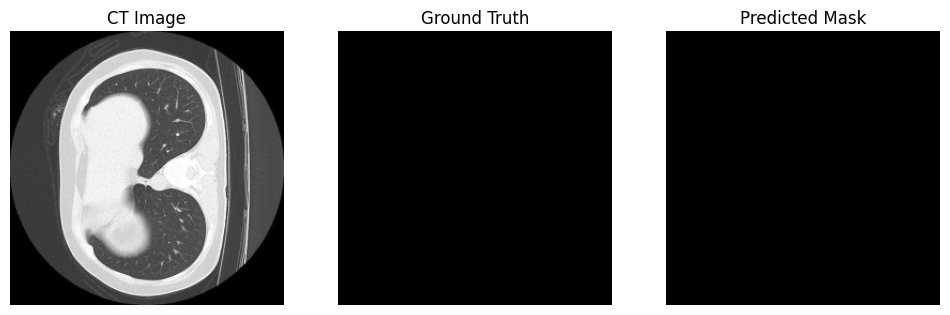

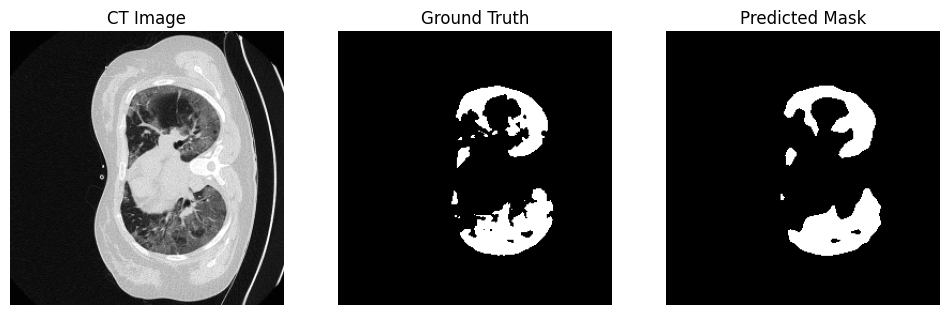

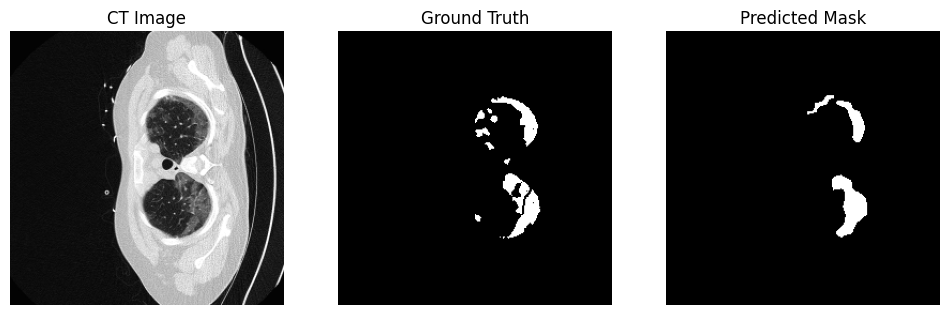

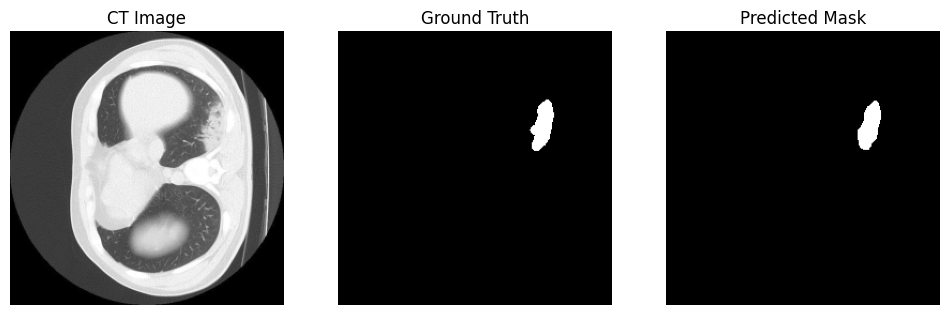

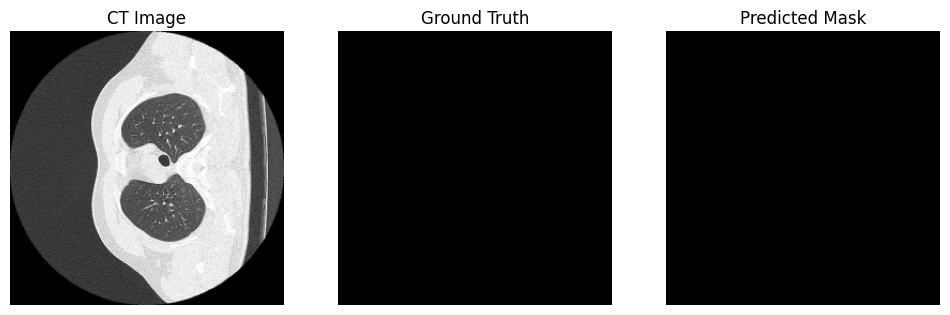

...

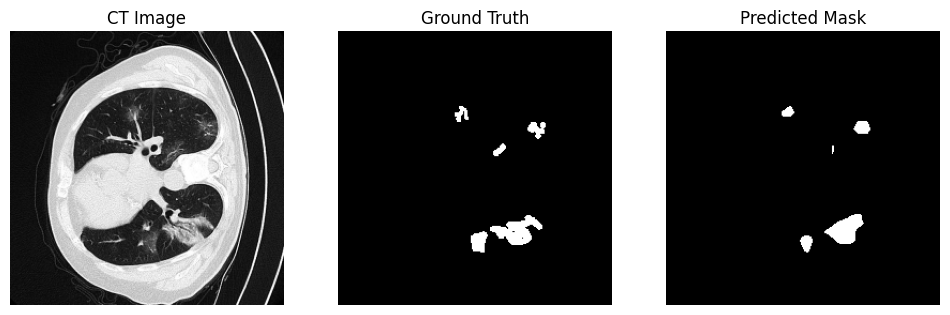

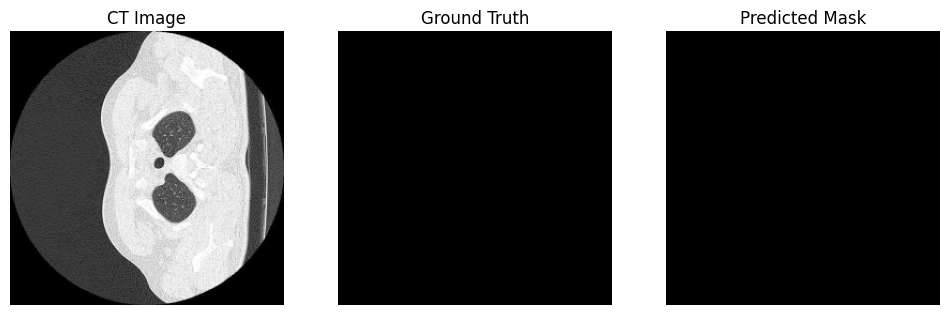

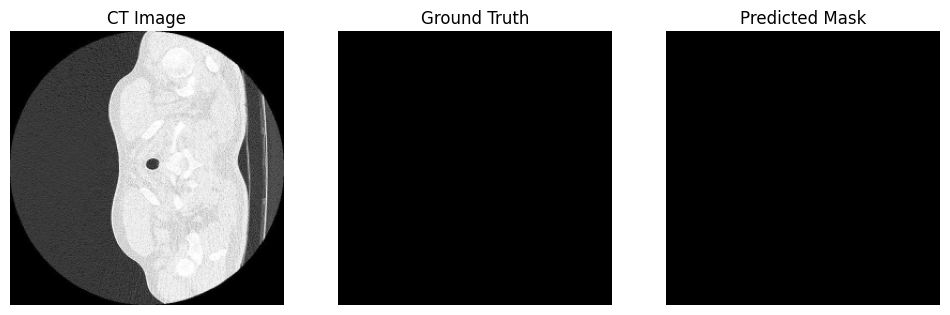

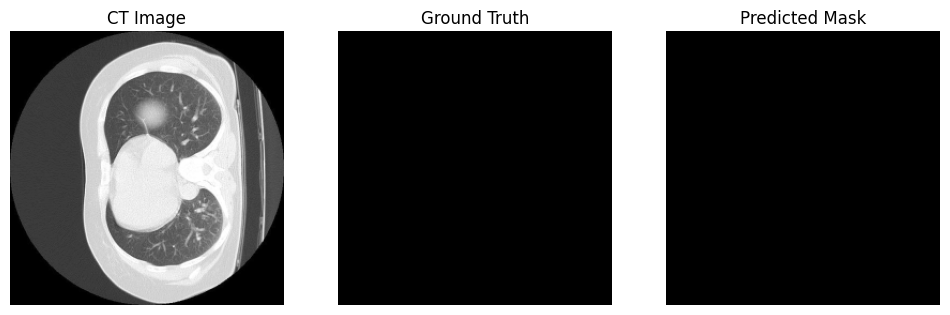

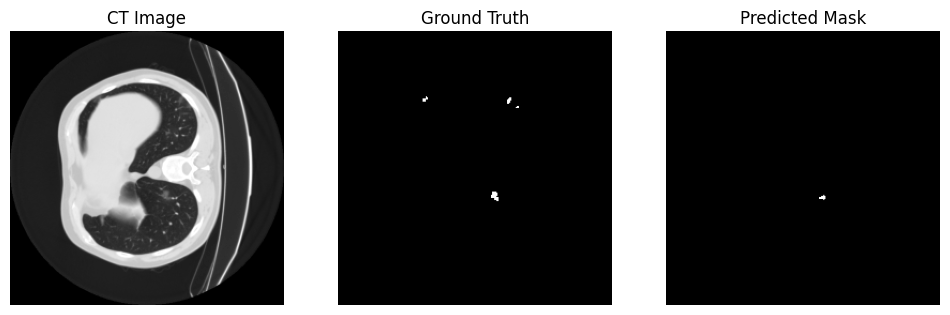

✅ Average Test Loss: 0.0086
✅ Average Dice Score: 0.8773
✅ Average IoU Score: 0.8215


In [21]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import models
import numpy as np
import matplotlib.pyplot as plt
import albumentations as A
from albumentations.pytorch import ToTensorV2

# ==== Dataset class ====
class CTMaskDataset(Dataset):
    def __init__(self, images, masks, transform=None):
        self.images = images
        self.masks = masks
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = self.images[idx]
        mask = self.masks[idx]

        if img.ndim == 2:  # add channel dimension
            img = np.expand_dims(img, axis=-1)

        if self.transform:
            augmented = self.transform(image=img, mask=mask)
            img = augmented['image']
            mask = augmented['mask']

        return img, mask.long()

# ==== Load test dataset ====
val_test_transform = A.Compose([
    A.Normalize(mean=(0.0,), std=(1.0,)),
    ToTensorV2()
])

images = np.load("/kaggle/working/preprocessed/images.npy")
lesion_masks = np.load("/kaggle/working/preprocessed/lesion_masks.npy")

dataset_size = len(images)
train_size = int(0.7 * dataset_size)
val_size = int(0.15 * dataset_size)
test_size = dataset_size - train_size - val_size

from torch.utils.data import random_split
full_dataset = CTMaskDataset(images, lesion_masks, transform=None)
_, _, test_subset = random_split(full_dataset, [train_size, val_size, test_size])

# Apply transforms
test_dataset = CTMaskDataset(
    images[test_subset.indices], lesion_masks[test_subset.indices], transform=val_test_transform
)
test_loader = DataLoader(test_dataset, batch_size=4, shuffle=False)

# ==== Load trained model ====
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.segmentation.deeplabv3_resnet50(weights=None, num_classes=2)
model.backbone.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
model.load_state_dict(torch.load("/kaggle/working/deeplabv3_resnet50_trained.pth", map_location=DEVICE))
model = model.to(DEVICE)
model.eval()

# ==== Helper functions ====
def dice_score(pred, target, smooth=1e-6):
    pred = pred.flatten()
    target = target.flatten()
    intersection = (pred * target).sum()
    return (2 * intersection + smooth) / (pred.sum() + target.sum() + smooth)

def iou_score(pred, target, smooth=1e-6):
    pred = pred.flatten()
    target = target.flatten()
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum() - intersection
    return (intersection + smooth) / (union + smooth)

# ==== Testing and visualization ====
criterion = nn.CrossEntropyLoss()
total_loss = 0
all_dice = []
all_iou = []

with torch.no_grad():
    for imgs, masks in test_loader:
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        outputs = model(imgs)['out']
        loss = criterion(outputs, masks)
        total_loss += loss.item()

        preds = torch.argmax(outputs, dim=1)

        # Calculate Dice and IoU per image
        for p, t in zip(preds, masks):
            all_dice.append(dice_score(p.cpu(), t.cpu()))
            all_iou.append(iou_score(p.cpu(), t.cpu()))

        # Visualization: show all images in the batch
        batch_limit = 5  # number of batches to visualize
batch_count = 0

criterion = nn.CrossEntropyLoss()
total_loss = 0
all_dice = []
all_iou = []

with torch.no_grad():
    for imgs, masks in test_loader:
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        outputs = model(imgs)['out']
        loss = criterion(outputs, masks)
        total_loss += loss.item()

        preds = torch.argmax(outputs, dim=1)

        # Calculate Dice and IoU per image
        for p, t in zip(preds, masks):
            all_dice.append(dice_score(p.cpu(), t.cpu()))
            all_iou.append(iou_score(p.cpu(), t.cpu()))

        # Visualization for this batch
        for i in range(min(4, imgs.size(0))):
            img_show = imgs[i].cpu().squeeze(0)  # remove channel dim
            mask_show = masks[i].cpu()
            pred_show = preds[i].cpu()

            fig, axes = plt.subplots(1, 3, figsize=(12, 4))
            axes[0].imshow(img_show, cmap='gray')
            axes[0].set_title("CT Image")
            axes[1].imshow(mask_show, cmap='gray')
            axes[1].set_title("Ground Truth")
            axes[2].imshow(pred_show, cmap='gray')
            axes[2].set_title("Predicted Mask")
            for ax in axes:
                ax.axis('off')
            plt.show()

avg_test_loss = total_loss / len(test_loader)
avg_dice = np.mean(all_dice)
avg_iou = np.mean(all_iou)

print(f"✅ Average Test Loss: {avg_test_loss:.4f}")
print(f"✅ Average Dice Score: {avg_dice:.4f}")
print(f"✅ Average IoU Score: {avg_iou:.4f}")


In [22]:
import torch
import torch.nn as nn
from torch.utils.data import DataLoader
from torchvision import models
import numpy as np
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix
import albumentations as A
from albumentations.pytorch import ToTensorV2

# ==== Dataset class ====
class CTMaskDataset(Dataset):
    def __init__(self, images, masks, transform=None):
        self.images = images
        self.masks = masks
        self.transform = transform

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        img = self.images[idx]
        mask = self.masks[idx]

        if img.ndim == 2:  # add channel dimension
            img = np.expand_dims(img, axis=-1)

        if self.transform:
            augmented = self.transform(image=img, mask=mask)
            img = augmented['image']
            mask = augmented['mask']

        return img, mask.long()

# ==== Load validation dataset ====
val_test_transform = A.Compose([
    A.Normalize(mean=(0.0,), std=(1.0,)),
    ToTensorV2()
])

images = np.load("/kaggle/working/preprocessed/images.npy")
lesion_masks = np.load("/kaggle/working/preprocessed/lesion_masks.npy")

dataset_size = len(images)
train_size = int(0.7 * dataset_size)
val_size = int(0.15 * dataset_size)
test_size = dataset_size - train_size - val_size

from torch.utils.data import random_split
full_dataset = CTMaskDataset(images, lesion_masks, transform=None)
_, val_subset, _ = random_split(full_dataset, [train_size, val_size, test_size])

val_dataset = CTMaskDataset(
    images[val_subset.indices], lesion_masks[val_subset.indices], transform=val_test_transform
)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False)

# ==== Load trained model ====
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.segmentation.deeplabv3_resnet50(weights=None, num_classes=2)
model.backbone.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
model.load_state_dict(torch.load("/kaggle/working/deeplabv3_resnet50_trained.pth", map_location=DEVICE))
model = model.to(DEVICE)
model.eval()

# ==== Validation loop and metrics ====
all_preds = []
all_targets = []

with torch.no_grad():
    for imgs, masks in val_loader:
        imgs, masks = imgs.to(DEVICE), masks.to(DEVICE)
        outputs = model(imgs)['out']
        preds = torch.argmax(outputs, dim=1)

        all_preds.append(preds.cpu().numpy().flatten())
        all_targets.append(masks.cpu().numpy().flatten())

all_preds = np.concatenate(all_preds)
all_targets = np.concatenate(all_targets)

# Metrics calculation
accuracy = accuracy_score(all_targets, all_preds)
precision = precision_score(all_targets, all_preds)
recall = recall_score(all_targets, all_preds)  # sensitivity
f1 = f1_score(all_targets, all_preds)
specificity = confusion_matrix(all_targets, all_preds)[0,0] / (confusion_matrix(all_targets, all_preds)[0,0] + confusion_matrix(all_targets, all_preds)[0,1])

# AUC-ROC requires probabilities; let's convert logits to softmax
probs = []
with torch.no_grad():
    for imgs, masks in val_loader:
        imgs = imgs.to(DEVICE)
        outputs = model(imgs)['out']
        softmax = torch.softmax(outputs, dim=1)[:,1,:,:]  # probability of class 1
        probs.append(softmax.cpu().numpy().flatten())
probs = np.concatenate(probs)
aucroc = roc_auc_score(all_targets, probs)

print(f"✅ Accuracy: {accuracy:.4f}")
print(f"✅ Precision: {precision:.4f}")
print(f"✅ Recall / Sensitivity: {recall:.4f}")
print(f"✅ Specificity: {specificity:.4f}")
print(f"✅ F1-score: {f1:.4f}")
print(f"✅ AUC-ROC: {aucroc:.4f}")


✅ Accuracy: 0.9979
✅ Precision: 0.8419
✅ Recall / Sensitivity: 0.8329
✅ Specificity: 0.9990
✅ F1-score: 0.8374
✅ AUC-ROC: 0.9981


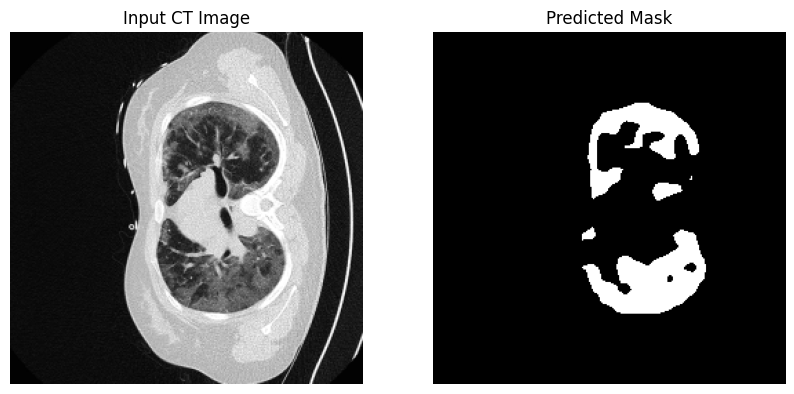

In [23]:
import torch
from torchvision import models
import numpy as np
import matplotlib.pyplot as plt
import albumentations as A
from albumentations.pytorch import ToTensorV2

# ==== Configuration ====
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
MODEL_PATH = "/kaggle/working/deeplabv3_resnet50_trained.pth"

# ==== Load trained model ====
model = models.segmentation.deeplabv3_resnet50(weights=None, num_classes=2)
model.backbone.conv1 = torch.nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False)
model.load_state_dict(torch.load(MODEL_PATH, map_location=DEVICE))
model = model.to(DEVICE)
model.eval()

# ==== Preprocessing for a single image ====
def preprocess_image(img):
    """
    img: numpy array of shape (H, W) or (H, W, 1)
    """
    if img.ndim == 2:
        img = np.expand_dims(img, axis=-1)
    
    transform = A.Compose([
        A.Normalize(mean=(0.0,), std=(1.0,)),
        ToTensorV2()
    ])
    augmented = transform(image=img)
    img_tensor = augmented['image'].unsqueeze(0)  # add batch dimension
    return img_tensor.to(DEVICE)

# ==== Predict mask ====
def predict_mask(img):
    img_tensor = preprocess_image(img)
    with torch.no_grad():
        output = model(img_tensor)['out']
        pred_mask = torch.argmax(output, dim=1).squeeze(0).cpu().numpy()  # remove batch dim
    return pred_mask

# ==== Example usage ====
# Pick a new image from the test dataset
images = np.load("/kaggle/working/preprocessed/images.npy")
lesion_masks = np.load("/kaggle/working/preprocessed/lesion_masks.npy")

# Assuming you want a test image
dataset_size = len(images)
train_size = int(0.7 * dataset_size)
val_size = int(0.15 * dataset_size)
test_size = dataset_size - train_size - val_size

from torch.utils.data import random_split
full_dataset = list(range(dataset_size))
_, _, test_indices = random_split(full_dataset, [train_size, val_size, test_size])

test_img = images[test_indices[0]]  # first image in test set

pred_mask = predict_mask(test_img)

# ==== Visualization ====
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(test_img, cmap='gray')
plt.title("Input CT Image")
plt.axis('off')

plt.subplot(1,2,2)
plt.imshow(pred_mask, cmap='gray')
plt.title("Predicted Mask")
plt.axis('off')

plt.show()
